In [1]:
import warnings
import requests
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder, StandardScaler, RobustScaler
from sklearn.cluster import DBSCAN, KMeans
from sklearn.mixture import GaussianMixture
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier, NearestNeighbors
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import f1_score, roc_auc_score, recall_score, precision_score
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import plotly.express as px
from geopy.distance import geodesic
from sklearn.exceptions import ConvergenceWarning

warnings.filterwarnings("ignore", category=ConvergenceWarning)

In [2]:
url ='https://data.gov.il/api/3/action/datastore_search?resource_id=21fde05f-62e3-401b-81cf-5c385862026d&limit=4000'
req= requests.get(url)
data_api = req.json()

In [3]:
data=pd.DataFrame(data_api['result']['records'])
data

,_id,Bank_Code,Bank_Name,Branch_Code,Atm_Num,ATM_Address,ATM_Address_Extra,City,Commission,ATM_Type,ATM_Location,Handicap_Access,X_Coordinate,Y_Coordinate
0,1,14,"בנק אוצר החייל בע""מ",355,3551,שד' מנחם בגין 7,"מרכז צימר, ככר הסיטי",אשדוד,לא,משיכת מזומן,על קיר הסניף,כן,31.788451,34.641896
1,2,14,"בנק אוצר החייל בע""מ",397,3976,שד' דואני 18,שד' דואני 18,יבנה,לא,מכשיר מידע/או מתן הוראות,במרחק של יותר מ- 500 מטר מהסניף,כן,31.873128,34.738887
2,3,14,"בנק אוצר החייל בע""מ",355,3552,שד' מנחם בגין 7,"מרכז צימר, ככר הסיטי",אשדוד,לא,משיכת מזומן,על קיר הסניף,כן,31.788451,34.641896
3,4,14,"בנק אוצר החייל בע""מ",377,3773,שד' התמרים 11,שדרות התמרים 11,אילת,לא,משיכת מזומן,בתוך הסניף,כן,29.555192,34.952591
4,5,14,"בנק אוצר החייל בע""מ",382,3821,יוספטל 92,קניון בת ים,בת ים,לא,משיכת מזומן,על קיר הסניף,כן,32.015182,34.756167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3364,3365,52,"בנק פועלי אגודת ישראל בע""מ",188,1882,יעקב לנדאו 4,,בני ברק,לא,משיכת מזומן,על קיר הסניף,כן,32.079522,34.833233
3365,3366,52,"בנק פועלי אגודת ישראל בע""מ",160,1601,אהרונוביץ 10,,בני ברק,לא,משיכת מזומן,על קיר הסניף,כן,32.091008,34.838876
3366,3367,26,"יובנק בע""מ",279,2791,הרצל 182,,רחובות,לא,משיכת מזומן,על קיר הסניף,כן,31.896860,34.811048
3367,3368,26,"יובנק בע""מ",288,2881,קרן היסוד 32,,ירושלים,לא,משיכת מזומן,על קיר הסניף,כן,31.772074,35.221880


In [4]:
#We noticed that some rows were written in the wrong columns. Since there were only a few of them, we decided to remove them as we have plenty of data.
data = data[(data['Handicap_Access'] == 'כן') | (data['Handicap_Access'] == 'לא')]


### Interactive map that shows the distribution of Handicap Accessibility 

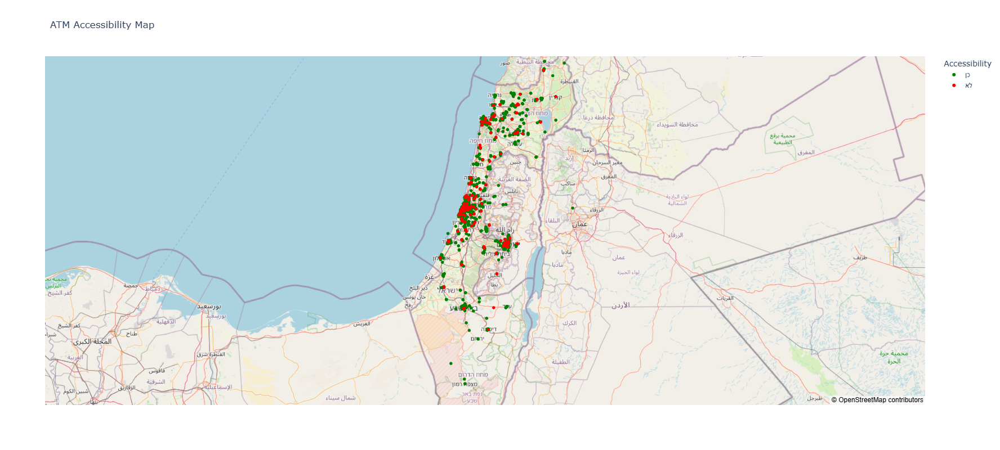

In [5]:
fig = px.scatter_mapbox(
    data,
    lat="X_Coordinate",
    lon="Y_Coordinate",
    color="Handicap_Access",  
    color_discrete_map={'כן': 'green', 'לא': 'red'}, 
    zoom=7,
    center={"lat":31.89, "lon": 35},
    title="ATM Accessibility Map",
)

fig.update_layout(
    mapbox_style="open-street-map",
    width=1200,  
    height=800,legend_title=dict(text="Accessibility"))

fig.show()

## Preprocessing

In [6]:
X=data.drop(columns=['Handicap_Access'])
y=data['Handicap_Access']

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [8]:
X_train = X_train.drop(columns=['ATM_Address_Extra', '_id', 'Bank_Name', 'Atm_Num'])
X_test = X_test.drop(columns=['ATM_Address_Extra', '_id', 'Bank_Name', 'Atm_Num'])

In [9]:
X_train = X_train.drop(X_train[X_train['X_Coordinate'] == ''].index)
X_test = X_test.drop(X_test[X_test['X_Coordinate'] == ''].index)

# המרת X_Coordinate ו-Y_Coordinate ל- float64
X_train['X_Coordinate'] = X_train['X_Coordinate'].astype('float64')
X_train['Y_Coordinate'] = X_train['Y_Coordinate'].astype('float64')

X_test['X_Coordinate'] = X_test['X_Coordinate'].astype('float64')
X_test['Y_Coordinate'] = X_test['Y_Coordinate'].astype('float64')

In [10]:
# המרת העמודות לקטגוריות ב-X_train
X_train['ATM_Type'] = X_train['ATM_Type'].astype('category')
X_train['ATM_Location'] = X_train['ATM_Location'].astype('category')

# המרת העמודות לקטגוריות ב-X_test
X_test['ATM_Type'] = X_test['ATM_Type'].astype('category')
X_test['ATM_Location'] = X_test['ATM_Location'].astype('category')

# המרת העמודה 'Handicap_Access' לקטגוריה ב-y
y_train = y_train.astype('category')
y_test = y_test.astype('category')


In [11]:
#A few outliers intrupted our data duo to wrong typing so we decided to remove that as well
# הסרת אאוטליירים מ-X_train
X_train = X_train[X_train['X_Coordinate'] < 90]
X_train = X_train[X_train['Y_Coordinate'] < 90]
y_train = y_train[X_train.index]  # סינון y_train לפי אותו אינדקס

# הסרת אאוטליירים מ-X_test
X_test = X_test[X_test['X_Coordinate'] < 90]
X_test = X_test[X_test['Y_Coordinate'] < 90]
y_test = y_test[X_test.index]  # סינון y_test לפי אותו אינדקס


In [12]:
# מיפוי ערכים בעמודת Handicap_Access
y_train = y_train.map({'כן': 1, 'לא': 0})
y_test = y_test.map({'כן': 1, 'לא': 0})

# מיפוי ערכים בעמודות Commission ב-X_train ו-X_test
X_train['Commission'] = X_train['Commission'].map({'כן': 1, 'לא': 0})
X_test['Commission'] = X_test['Commission'].map({'כן': 1, 'לא': 0})


### ONE HOT Encoder

In [15]:
columns_to_encode = ['ATM_Address', 'City', 'ATM_Type', 'ATM_Location']


encoder = OneHotEncoder(sparse_output=False,handle_unknown='ignore')

# ביצוע fit_transform על X_train עבור העמודות הספציפיות
X_train_encoded = encoder.fit_transform(X_train[columns_to_encode])

# ביצוע transform על X_test עבור העמודות הספציפיות
X_test_encoded = encoder.transform(X_test[columns_to_encode])

# המרת התוצאה ל-DataFrame
X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=encoder.get_feature_names_out(columns_to_encode))
X_test_encoded_df = pd.DataFrame(X_test_encoded, columns=encoder.get_feature_names_out(columns_to_encode))

# מחיקת העמודות המקוריות מה-X_train ו-X_test והוספת העמודות החדשות
X_train = X_train.drop(columns=columns_to_encode).reset_index(drop=True)
X_test = X_test.drop(columns=columns_to_encode).reset_index(drop=True)

X_train = pd.concat([X_train, X_train_encoded_df], axis=1)
X_test = pd.concat([X_test, X_test_encoded_df], axis=1)

### Scaling

In [16]:
scaler = StandardScaler()

# בחירת העמודות שמכילות את ה-X_coordinates
coordinates_train = X_train[['X_Coordinate', 'Y_Coordinate']]
coordinates_test = X_test[['X_Coordinate', 'Y_Coordinate']]

# התאמת ה-Scaler רק על X_train ואז טרנספורמציה של X_train
scaled_coordinates_train = scaler.fit_transform(coordinates_train)

# חזרה על אותו Scaling על X_test תוך שימוש ב-Scaler שנלמד מ-X_train
scaled_coordinates_test = scaler.transform(coordinates_test)

# החזרת הערכים הממומנים חזרה ל-X_train ו-X_test
X_train[['X_Coordinate', 'Y_Coordinate']] = scaled_coordinates_train
X_test[['X_Coordinate', 'Y_Coordinate']] = scaled_coordinates_test

#### Implementing the classification models and assessing their performance.

In [17]:
def eval(model, X_train, X_test, y_train, y_test):
   
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    
    #chat-gpt  only wrote if and else statements in this function we did
    if hasattr(model, 'predict_proba'):
        y_prob = model.predict_proba(X_test)[:, 1] 
    else:
        y_prob = model.decision_function(X_test)
        y_prob = (y_prob - np.min(y_prob)) / (np.max(y_prob) - np.min(y_prob))  

    
    cv = cross_val_score(model, X_train, y_train, scoring='accuracy', cv=5)
    

    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    
    print(f"Cross-validation mean accuracy = {float(np.mean(cv))}")
    print(f"F1 score = {f1}")
    print(f"AUC = {auc}")
    print(f"Recall = {recall}")
    print(f"Precision = {precision}")

In [18]:
#We chose to predict whether there will be handicap accessibility based on the location, bank information, city, and ATM type. 
# Following this, we aim to cluster areas and recommend regions across the country where enforcement of handicap accessibility should be prioritized.

Logistic Regression 

In [19]:
eval(LogisticRegression(),X_train,X_test,y_train,y_test)

Cross-validation mean accuracy = 0.934799466355374
F1 score = 0.9772036474164134
AUC = 0.5682218766200104
Recall = 1.0
Precision = 0.9554234769687965


Random Forest 

In [20]:
eval(RandomForestClassifier(),X_train,X_test,y_train,y_test)

Cross-validation mean accuracy = 0.929581144556547
F1 score = 0.9693251533742331
AUC = 0.7272420943494039
Recall = 0.9828926905132193
Precision = 0.9561270801815431


Support Vector Machine

In [21]:
eval(SVC(),X_train,X_test,y_train,y_test)

Cross-validation mean accuracy = 0.9351719058339587
F1 score = 0.9772036474164134
AUC = 0.5057542768273717
Recall = 1.0
Precision = 0.9554234769687965


XGBoost

In [22]:
eval(XGBClassifier(),X_train,X_test,y_train,y_test) 

Cross-validation mean accuracy = 0.9262271046999638
F1 score = 0.9698841698841699
AUC = 0.8072576464489374
Recall = 0.9766718506998445
Precision = 0.9631901840490797


K-Nearest Neighbors

In [23]:
eval(KNeighborsClassifier(),X_train,X_test,y_train,y_test)

Cross-validation mean accuracy = 0.9306998526918481
F1 score = 0.9717341482047365
AUC = 0.7101088646967341
Recall = 0.9891135303265941
Precision = 0.954954954954955


# Clusters

### Preprocessing

In [24]:
data = data.drop(data[data['X_Coordinate']==''].index)
data['X_Coordinate'] = data['X_Coordinate'].astype('float64')
data['Y_Coordinate'] = data['Y_Coordinate'].astype('float64')
data = data[data['X_Coordinate'] < 90]
data = data[data['Y_Coordinate'] < 90]

In [25]:
# חישוב המרחק האווירי בין נקודות
def calculate_distance(row1, row2):
    point1 = (row1['X_Coordinate'], row1['Y_Coordinate'])
    point2 = (row2['X_Coordinate'], row2['Y_Coordinate'])
    return geodesic(point1, point2).meters  # מחשב במטרים

## DBSCAN

Finding the optimal Epsilon

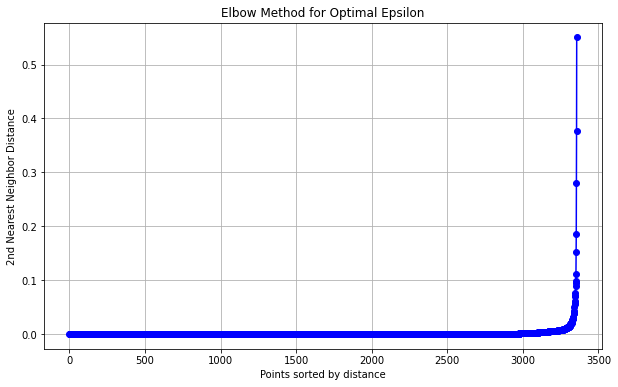

In [26]:
coordinates = data[['X_Coordinate', 'Y_Coordinate']].values
neighbors = NearestNeighbors(n_neighbors=2) 
neighbors_fit = neighbors.fit(coordinates)
distances, indices = neighbors_fit.kneighbors(coordinates)


distances = np.sort(distances[:, 1])  
plt.figure(figsize=(10, 6))
plt.plot(distances, marker='o', linestyle='-', color='blue')
plt.title("Elbow Method for Optimal Epsilon")
plt.xlabel("Points sorted by distance")
plt.ylabel("2nd Nearest Neighbor Distance")
plt.grid()
plt.show()

In [27]:
data_dbscan = data.copy()
dbscan = DBSCAN(eps=0.068, min_samples=3)  
data_dbscan['Cluster'] = dbscan.fit_predict(coordinates)

In [28]:
fig = px.scatter_mapbox(
    data_dbscan,
    lat="X_Coordinate",
    lon="Y_Coordinate",
    color="Cluster", 
    hover_data=["X_Coordinate", "Y_Coordinate", "Cluster", "Handicap_Access"],  
    color_continuous_scale='Viridis',  
    zoom=7,
    center={"lat":31.89, "lon": 35},
    title="ATM Clusters Map"
)

fig.update_layout(
    mapbox_style="open-street-map",
    width=1200,
    height=800,
    legend_title=dict(text="Clusters")
)

fig.show()

In [29]:
# הוספת עמודה לסיווג סוגי החריגות
data_dbscan['Violation_Type'] = 'לא חריג'  # ערך ברירת מחדל

# עבור כל קלאסטר
for cluster_num in data_dbscan['Cluster'].unique():
    cluster_data_dbscan = data_dbscan[data_dbscan['Cluster'] == cluster_num]
    
    # עבור כל נקודת כספומט
    for index, row in cluster_data_dbscan.iterrows():

        # דלג אם הכספומט בתוך הסניף או על קיר הסניף
        if row['ATM_Location'] in ['בתוך הסניף', 'על קיר הסניף']:
            data_dbscan.loc[index, 'Violation'] = 'לא'  # לא חריג
            data_dbscan.loc[index, 'Violation_Type'] = 'לא חריג'
            continue

        if row['Handicap_Access'] == 'לא':
            found_accessible = False
            
            # בדוק אם יש כספומט נגיש אחר בטווח של 50 מטר
            for idx, other_row in cluster_data_dbscan.iterrows():
                if calculate_distance(row, other_row) <= 50 and other_row['Handicap_Access'] == 'כן':
                    found_accessible = True
                    break

            # אם לא נמצא כספומט נגיש בטווח הנדרש, סמן כחריג
            if not found_accessible:
                data_dbscan.loc[index, 'Violation'] = 'כן'  # חריג
                data_dbscan.loc[index, 'Violation_Type'] = 'אין כספומט נגיש בקרבה'
            else:
                data_dbscan.loc[index, 'Violation'] = 'לא'  # לא חריג
                data_dbscan.loc[index, 'Violation_Type'] = 'לא חריג'
        else:
            # במקרה של כספומט עם גישה לנכים
            found_cash_withdrawal = False
            found_info_device = False
            
            # חפש בטווח 50 מטר כספומט נוסף נגיש מכל סוג
            for idx, other_row in cluster_data_dbscan.iterrows():
                if calculate_distance(row, other_row) <= 50 and other_row['Handicap_Access'] == 'כן':
                    if other_row['ATM_Type'] == 'משיכת מזומן':
                        found_cash_withdrawal = True
                    elif other_row['ATM_Type'] == 'מכשיר מידע/או מתן הוראות':
                        found_info_device = True

            # בדוק אם יש שני סוגי הכספומטים נגישים בטווח, או שהכספומט עצמו ממוקם בסניף
            if (found_cash_withdrawal and found_info_device) or row['ATM_Location'] in ['בתוך הסניף', 'על קיר הסניף']:
                data_dbscan.loc[index, 'Violation'] = 'לא'  # לא חריג
                data_dbscan.loc[index, 'Violation_Type'] = 'לא חריג'
            else:
                data_dbscan.loc[index, 'Violation'] = 'כן'  # חריג
                data_dbscan.loc[index, 'Violation_Type'] = 'אין מגוון סוגים נגישים בקרבה'


## KMeans

In [32]:
data_kmeans = data.copy()

# יצירת מודל KMeans
kmeans = KMeans(n_clusters=5)

# הנחת הקואורדינטות של הכספומטים (למשל columns 'latitude' ו-'longitude')
coordinates = data_kmeans[['X_Coordinate', 'Y_Coordinate']]

# התאמת המודל לנתונים
data_kmeans['Cluster'] = kmeans.fit_predict(coordinates)

In [33]:
# הדבקת העמודה Cluster לתוך המפה
fig = px.scatter_mapbox(
    data_kmeans,
    lat="X_Coordinate",
    lon="Y_Coordinate",
    color="Cluster",  
    hover_data=["X_Coordinate", "Y_Coordinate", "Cluster", "Handicap_Access"],  
    color_continuous_scale='Viridis',  
    zoom=7,
    center={"lat":31.89, "lon": 35},
    title="ATM Clusters Map"
)

fig.update_layout(
    mapbox_style="open-street-map",
    width=1200,
    height=800,
    legend_title=dict(text="Clusters")
)

fig.show()

In [34]:
# יצירת מילון של המפה בין קלאסטרים לשמות
cluster_to_area = {
    0: 'צפון',
    1: 'מרכז',
    2: 'דרום',
    3: 'אילת',
    4: 'ירושלים',
}

# הוספת העמודה החדשה עם הערכים המתאימים
data_kmeans['Area'] = data_kmeans['Cluster'].map(cluster_to_area)

In [35]:

# הוספת עמודה לסיווג סוגי החריגות
data_kmeans['Violation_Type'] = 'לא חריג'  # ערך ברירת מחדל

# עבור כל קלאסטר
for cluster_num in data_kmeans['Cluster'].unique():
    cluster_data_kmeans = data_kmeans[data_kmeans['Cluster'] == cluster_num]
    
    # עבור כל נקודת כספומט
    for index, row in cluster_data_kmeans.iterrows():

        # דלג אם הכספומט בתוך הסניף או על קיר הסניף
        if row['ATM_Location'] in ['בתוך הסניף', 'על קיר הסניף']:
            data_kmeans.loc[index, 'Violation'] = 'לא'  # לא חריג
            data_kmeans.loc[index, 'Violation_Type'] = 'לא חריג'
            continue

        if row['Handicap_Access'] == 'לא':
            found_accessible = False
            
            # בדוק אם יש כספומט נגיש אחר בטווח של 50 מטר
            for idx, other_row in cluster_data_kmeans.iterrows():
                if calculate_distance(row, other_row) <= 50 and other_row['Handicap_Access'] == 'כן':
                    found_accessible = True
                    break

            # אם לא נמצא כספומט נגיש בטווח הנדרש, סמן כחריג
            if not found_accessible:
                data_kmeans.loc[index, 'Violation'] = 'כן'  # חריג
                data_kmeans.loc[index, 'Violation_Type'] = 'אין כספומט נגיש בקרבה'
            else:
                data_kmeans.loc[index, 'Violation'] = 'לא'  # לא חריג
                data_kmeans.loc[index, 'Violation_Type'] = 'לא חריג'
        else:
            # במקרה של כספומט עם גישה לנכים
            found_cash_withdrawal = False
            found_info_device = False
            
            # חפש בטווח 50 מטר כספומט נוסף נגיש מכל סוג
            for idx, other_row in cluster_data_kmeans.iterrows():
                if calculate_distance(row, other_row) <= 50 and other_row['Handicap_Access'] == 'כן':
                    if other_row['ATM_Type'] == 'משיכת מזומן':
                        found_cash_withdrawal = True
                    elif other_row['ATM_Type'] == 'מכשיר מידע/או מתן הוראות':
                        found_info_device = True

            # בדוק אם יש שני סוגי הכספומטים נגישים בטווח, או שהכספומט עצמו ממוקם בסניף
            if (found_cash_withdrawal and found_info_device) or row['ATM_Location'] in ['בתוך הסניף', 'על קיר הסניף']:
                data_kmeans.loc[index, 'Violation'] = 'לא'  # לא חריג
                data_kmeans.loc[index, 'Violation_Type'] = 'לא חריג'
            else:
                data_kmeans.loc[index, 'Violation'] = 'כן'  # חריג
                data_kmeans.loc[index, 'Violation_Type'] = 'אין מגוון סוגים נגישים בקרבה'


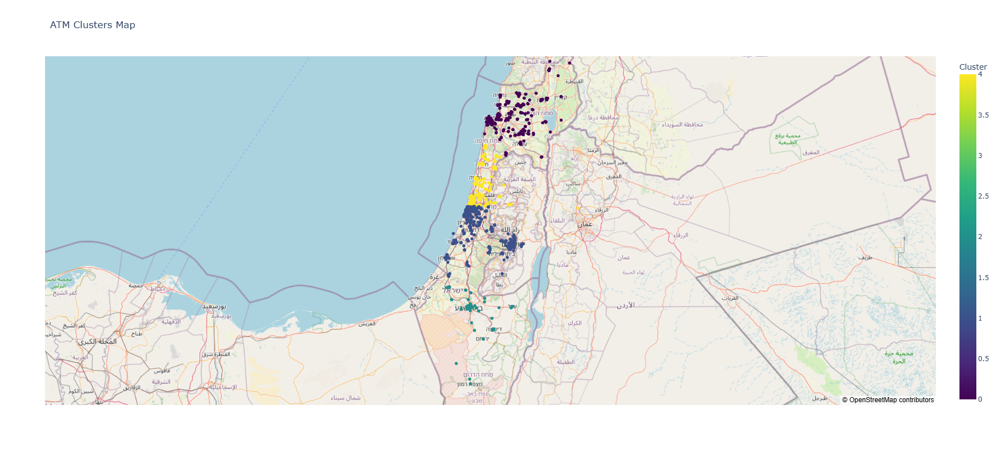

In [38]:
fig = px.scatter_mapbox(
    data_kmeans,
    lat="X_Coordinate",
    lon="Y_Coordinate",
    color="Cluster",  
    hover_data=["X_Coordinate", "Y_Coordinate", "Cluster", "Handicap_Access"], 
    color_continuous_scale='Viridis',
    zoom=7,
    center={"lat":31.89, "lon": 35},
    title="ATM Clusters Map"
)

fig.update_layout(
    mapbox_style="open-street-map",
    width=1200,
    height=800,
    legend_title=dict(text="Clusters")
)

fig.show()

## Gaussian Mixture Models

In [39]:
data_gmm = data.copy()
# הגדרת המודל
gmm = GaussianMixture(n_components=6, random_state=42)  # אתה יכול לשנות את n_components לכמות הקלאסטרים שתרצה

# התאמת המודל
data_gmm['Cluster'] = gmm.fit_predict(data_gmm[['X_Coordinate', 'Y_Coordinate']])

In [40]:

fig = px.scatter_mapbox(
    data_gmm,
    lat="X_Coordinate",
    lon="Y_Coordinate",
    color="Cluster",  
    hover_data=["X_Coordinate", "Y_Coordinate", "Cluster", "Handicap_Access"], 
    color_continuous_scale='Viridis',  
    zoom=7,
    center={"lat":31.89, "lon": 35},
    title="ATM Clusters Map"
)

fig.update_layout(
    mapbox_style="open-street-map",
    width=1200,
    height=800,
    legend_title=dict(text="Clusters")
)

fig.show()

In [41]:
# יצירת מילון של המפה בין קלאסטרים לשמות
cluster_to_area = {
    0: 'צפון',
    1: 'דרום',
    2: 'אילת',
    3: 'חריגים',
    4: 'ירושלים',
    5: 'מרכז'
}

# הוספת העמודה החדשה עם הערכים המתאימים
data_gmm['Area'] = data_gmm['Cluster'].map(cluster_to_area)

In [51]:

# הוספת עמודה לסיווג סוגי החריגות
data_gmm['Violation_Type'] = 'לא חריג'  # ערך ברירת מחדל

# עבור כל קלאסטר
for cluster_num in data_gmm['Cluster'].unique():
    cluster_data_gmm = data_gmm[data_gmm['Cluster'] == cluster_num]
    
    # עבור כל נקודת כספומט
    for index, row in cluster_data_gmm.iterrows():

        # דלג אם הכספומט בתוך הסניף או על קיר הסניף
        if row['ATM_Location'] in ['בתוך הסניף', 'על קיר הסניף']:
            data_gmm.loc[index, 'Violation'] = 'לא'  # לא חריג
            data_gmm.loc[index, 'Violation_Type'] = 'לא חריג'
            continue

        if row['Handicap_Access'] == 'לא':
            found_accessible = False
            
            # בדוק אם יש כספומט נגיש אחר בטווח של 50 מטר
            for idx, other_row in cluster_data_gmm.iterrows():
                if calculate_distance(row, other_row) <= 10 and other_row['Handicap_Access'] == 'כן':
                    found_accessible = True
                    break

            # אם לא נמצא כספומט נגיש בטווח הנדרש, סמן כחריג
            if not found_accessible:
                data_gmm.loc[index, 'Violation'] = 'כן'  # חריג
                data_gmm.loc[index, 'Violation_Type'] = 'אין כספומט נגיש בקרבה'
            else:
                data_gmm.loc[index, 'Violation'] = 'לא'  # לא חריג
                data_gmm.loc[index, 'Violation_Type'] = 'לא חריג'
        else:
            # במקרה של כספומט עם גישה לנכים
            found_cash_withdrawal = False
            found_info_device = False
            
            # חפש בטווח 50 מטר כספומט נוסף נגיש מכל סוג
            for idx, other_row in cluster_data_gmm.iterrows():
                if calculate_distance(row, other_row) <= 50 and other_row['Handicap_Access'] == 'כן':
                    if other_row['ATM_Type'] == 'משיכת מזומן':
                        found_cash_withdrawal = True
                    elif other_row['ATM_Type'] == 'מכשיר מידע/או מתן הוראות':
                        found_info_device = True

            # בדוק אם יש שני סוגי הכספומטים נגישים בטווח, או שהכספומט עצמו ממוקם בסניף
            if (found_cash_withdrawal and found_info_device) or row['ATM_Location'] in ['בתוך הסניף', 'על קיר הסניף']:
                data_gmm.loc[index, 'Violation'] = 'לא'  # לא חריג
                data.loc[index, 'Violation_Type'] = 'לא חריג'
            else:
                data_gmm.loc[index, 'Violation'] = 'כן'  # חריג
                data.loc[index, 'Violation_Type'] = 'אין מגוון סוגים נגישים בקרבה'


In [52]:
data_gmm['Violation_Type'].value_counts()

Violation_Type
לא חריג                  3346
אין כספומט נגיש בקרבה      11
Name: count, dtype: int64

In [53]:
data_gmm['Violation'].value_counts()

Violation
לא    2921
כן     436
Name: count, dtype: int64

In [54]:
# יצירת מפה שמציגה את שני סוגי החריגות
fig = px.scatter_mapbox(
    data_gmm,
    lat="X_Coordinate", 
    lon="Y_Coordinate",  
    color="Violation",  
    hover_data=["X_Coordinate", "Y_Coordinate", "Violation_Type"],  
    color_discrete_map={"כן": "red", "לא": "green"},  
    zoom=7,  # רמת הזום במפה
    center={"lat": 31.89, "lon": 35},  
    title="מפת חריגים או לא חריגים"  # כותרת המפה
)

# התאמות עיצוב למפה
fig.update_layout(
    mapbox_style="open-street-map",
    width=1200,  # רוחב המפה
    height=800,  # גובה המפה
    legend_title=dict(text="חריגים")
)

# הצגת המפה
fig.show()


In [55]:
# קלאסטרינג של כל שיטה
cluster_labels_dbscan = data_dbscan['Cluster']
cluster_labels_kmeans = data_kmeans['Cluster']
cluster_labels_gmm = data_gmm['Cluster']

# הצגת רק את Silhouette Score
silhouette_scores = {
    'DBSCAN': silhouette_score(data[['X_Coordinate', 'Y_Coordinate']], cluster_labels_dbscan),
    'K-Means': silhouette_score(data[['X_Coordinate', 'Y_Coordinate']], cluster_labels_kmeans),
    'GMM': silhouette_score(data[['X_Coordinate', 'Y_Coordinate']], cluster_labels_gmm)
}

# הדפסת התוצאות
for method, score in silhouette_scores.items():
    print(f"{method} Silhouette Score: {score}")


DBSCAN Silhouette Score: 0.3872420122264845
K-Means Silhouette Score: 0.3723008227493419
GMM Silhouette Score: 0.5998970523868988


## We chose the GMM cluster as the best option for our task based on the silhouette score, our knowledge, and the visualizations.

In [56]:
data_gmm[data_gmm['Violation'] == 'כן'].groupby('Cluster')['Violation'].count()

Cluster
0     97
1     50
2      2
3      1
4     74
5    212
Name: Violation, dtype: int64

In [57]:
city_violations = data_gmm[data_gmm['Cluster'] == 5].groupby('City')['Violation'].count().sort_values(ascending=False)
city_violations

City
תל אביב -יפו    265
אשדוד            99
פתח תקווה        97
בני ברק          97
נתניה            93
               ... 
בני ציון          1
קרני שומרון       1
קריית עקרון       1
פלמחים            1
בת חפר            1
Name: Violation, Length: 66, dtype: int64

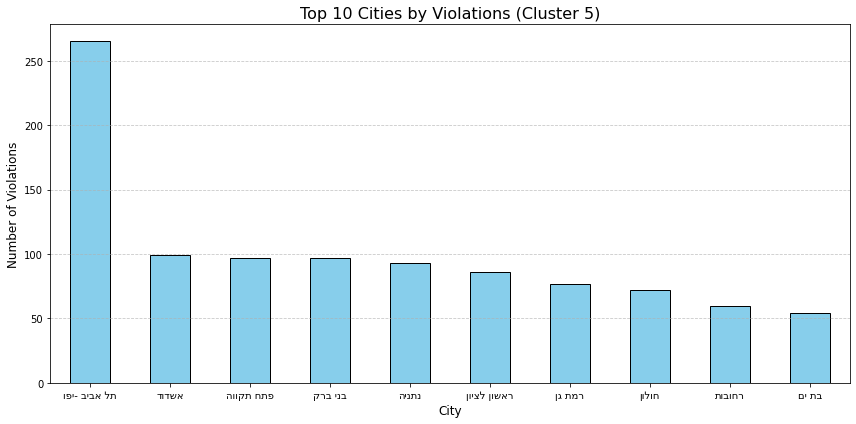

In [58]:
# בחירת 10 הערים המובילות
top_10_cities = city_violations.head(10)
# יצירת גרף עמודות
plt.figure(figsize=(12, 6))
top_10_cities.plot(kind='bar', color='skyblue', edgecolor='black')

# הוספת כותרות וצירים
plt.title("Top 10 Cities by Violations (Cluster 5)", fontsize=16)
plt.xlabel("City", fontsize=12)
plt.ylabel("Number of Violations", fontsize=12)

# היפוך תוויות הערים על ציר ה-X
plt.xticks(ticks=range(len(top_10_cities)), labels=[city[::-1] for city in top_10_cities.index], rotation=0, fontsize=10, rotation_mode='anchor')

plt.grid(axis='y', linestyle='--', alpha=0.7)

# הצגת הגרף
plt.tight_layout()
plt.show()

### We can see that the city of Tel Aviv needs to address the issue of accessibility for individuals with disabilities.